<a href="https://colab.research.google.com/github/francescolp23/FDS_final_project_2025_EFF/blob/main/Parziale.FDS_Final_Project_EFF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1. Import data**

## 1.1.1 Helper function

Mount Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


Verifichiamo che la cartella sia visibile

In [2]:
!ls /content/drive/MyDrive

 charizeff-report-challenge.pdf   Classroom  'Colab Notebooks'	 PIDray_DATA


In [3]:
!unzip /content/drive/MyDrive/PIDray-main.zip -d /content/drive/MyDrive/PIDray_DATA


unzip:  cannot find or open /content/drive/MyDrive/PIDray-main.zip, /content/drive/MyDrive/PIDray-main.zip.zip or /content/drive/MyDrive/PIDray-main.zip.ZIP.


Impostiamo la variabile del percorso

In [4]:
DATASET_DIR = "/content/drive/MyDrive/PIDray_DATA"

Controlliamo che ci siano tutti i file

In [5]:
!ls $DATASET_DIR

annotation.tar.gz  PIDray-main	test.tar.gz  train_0.tar.gz  train_1.tar.gz


### [Codice dismesso] - Creiamo le cartelle nella VM di Colab (cartelle vuote pronte a ricevere le immagini che estrarremo successivamente)

In [6]:
#!mkdir -p /content/train_0 /content/train_1 /content/test /content/annotation


In [7]:
#!tar -tf $DATASET_DIR/train_0.tar.gz | wc -l


In [8]:
#!tar -tf $DATASET_DIR/train_1.tar.gz | wc -l


In [9]:
#!tar -tf $DATASET_DIR/test.tar.gz | wc -l


Una volta verificato che il dataset è troppo grande, e che le dimensioni non sarebbero tollerabili per il nostro lavoro, decidiamo di ridurre, lavorando solo su subset dei dati originali

## 1.1.2 Import Libraries

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import torch
import tensorflow as tf
# import

## 1.2 Estrazione Subset dei Dati

Scegliamo di estrarre in modo leggermente sbilanciato per riprodurre quanto più possibile la realtà e non avere un modello che sia troppo equilibrato (che quindi non sia proprio realistico)
* 60% di immagini relative a situazioni "safe", ovvero in cui non ci sono oggetti proibiti -> classe 0
* 40% di immagini relative a situazioni "hard", ovvero in cui ci sono oggetti proibiti -> classe 1

In [11]:
!mkdir -p /content/dataset_safe
!mkdir -p /content/dataset_prohibited


In [12]:
# controlli
!tar -tf $DATASET_DIR/train_0.tar.gz | head -n 20


train/xray_00000.png
train/xray_00001.png
train/xray_00002.png
train/xray_00003.png
train/xray_00004.png
train/xray_00005.png
train/xray_00006.png
train/xray_00007.png
train/xray_00008.png
train/xray_00009.png
train/xray_00010.png
train/xray_00011.png
train/xray_00012.png
train/xray_00013.png
train/xray_00014.png
train/xray_00015.png
train/xray_00016.png
train/xray_00017.png
train/xray_00018.png
train/xray_00019.png


In [13]:
# controlli
!tar -tf $DATASET_DIR/train_1.tar.gz | head -n 20


train/xray_38457.png
train/xray_38458.png
train/xray_38459.png
train/xray_38460.png
train/xray_38461.png
train/xray_38462.png
train/xray_38463.png
train/xray_38464.png
train/xray_38465.png
train/xray_38466.png
train/xray_38467.png
train/xray_38468.png
train/xray_38469.png
train/xray_38470.png
train/xray_38471.png
train/xray_38472.png
train/xray_38473.png
train/xray_38474.png
train/xray_38475.png
train/xray_38476.png


Procediamo estraendo le 6000 immagini da `train_0.tar.gz`

In [14]:
import tarfile
import os

N0 = 6000
count = 0

tar_path_0 = f"{DATASET_DIR}/train_0.tar.gz"

with tarfile.open(tar_path_0, 'r:gz') as tar:
    # Filtra SOLO le immagini PNG
    image_members = [m for m in tar.getmembers() if m.isfile() and m.name.endswith(".png")]

    for m in image_members:
        if count >= N0:
            break

        # estrai senza la sottocartella "train/"
        m.name = os.path.basename(m.name)
        tar.extract(m, path="/content/dataset_safe")
        count += 1

print("Immagini SAFE estratte:", count)


/tmp/ipython-input-1971957161.py:19: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extract(m, path="/content/dataset_safe")


Immagini SAFE estratte: 6000


Procediamo con l'estrazione delle 4000 immagini da `train_1.tar.gz`

In [15]:
import tarfile
import os

N1 = 4000
count = 0

tar_path_1 = f"{DATASET_DIR}/train_1.tar.gz"

with tarfile.open(tar_path_1, 'r:gz') as tar:
    image_members = [m for m in tar.getmembers() if m.isfile() and m.name.endswith(".png")]

    for m in image_members:
        if count >= N1:
            break

        m.name = os.path.basename(m.name)
        tar.extract(m, path="/content/dataset_prohibited")
        count += 1

print("Immagini PROHIBITED estratte:", count)


/tmp/ipython-input-3277754572.py:17: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extract(m, path="/content/dataset_prohibited")


Immagini PROHIBITED estratte: 4000


Controlliamo che sia tutto corretto

In [16]:
!ls /content/dataset_safe | wc -l
!ls /content/dataset_prohibited | wc -l
# ci aspettiamo 6000 al primo e 4000 al secondo

6000
4000


# **2. Data Exploration**

Una volta ottenuti i due subset dei dati di training possiamo procedere con un'ispezione preliminare e valutare la fattibilità progetto rispetto ai dati a disposizione

_Verifichiamo che le immagini siano leggibili_

File: xray_02027.png
Formato: PNG
Dimensione: (380, 448)
Mode: RGB


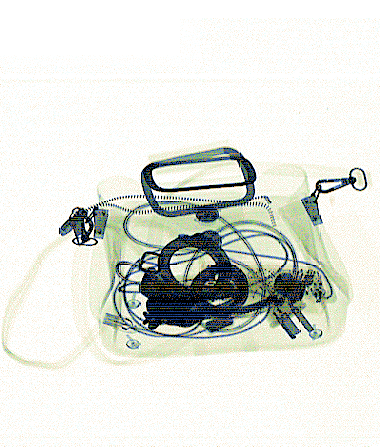

In [ ]:
from PIL import Image
import os

safe_dir = "/content/dataset_safe"
prohib_dir = "/content/dataset_prohibited"

def get_random_image_info(path):
    file = os.listdir(path)[0]  # pick one file
    img = Image.open(os.path.join(path, file))
    print("File:", file)
    print("Formato:", img.format)
    print("Dimensione:", img.size)
    print("Mode:", img.mode)
    return img

img_safe = get_random_image_info(safe_dir)
img_safe


*Valutiamo la qualità visiva delle immagini*

File: xray_40880.png
Formato: PNG
Dimensione: (1126, 750)
Mode: RGB


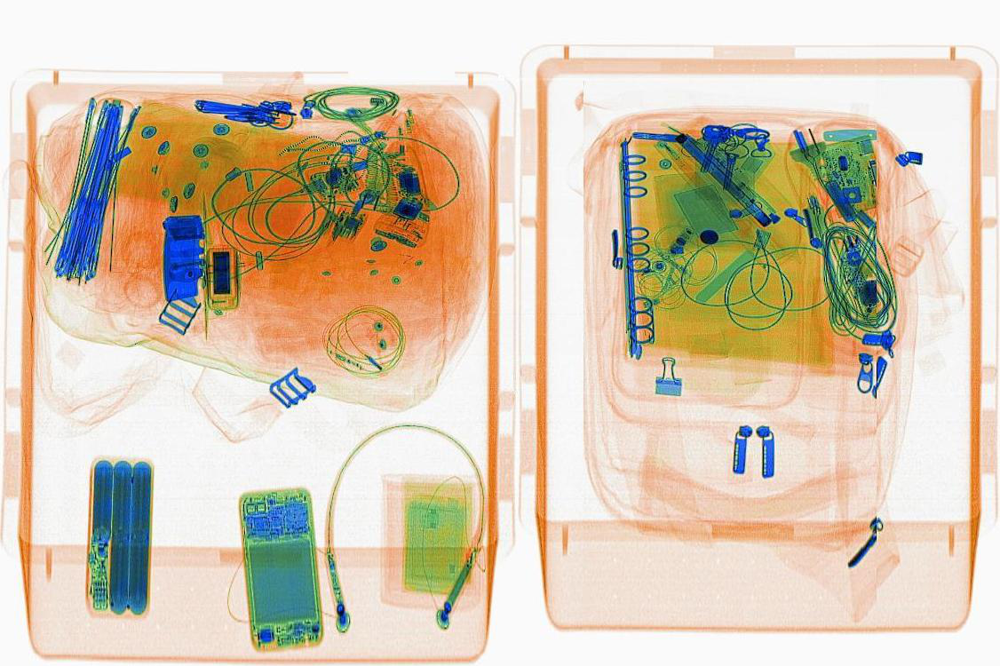

In [ ]:
img_prohib = get_random_image_info(prohib_dir)
img_prohib


*Visualizziamo delle immagini in modo casuale*

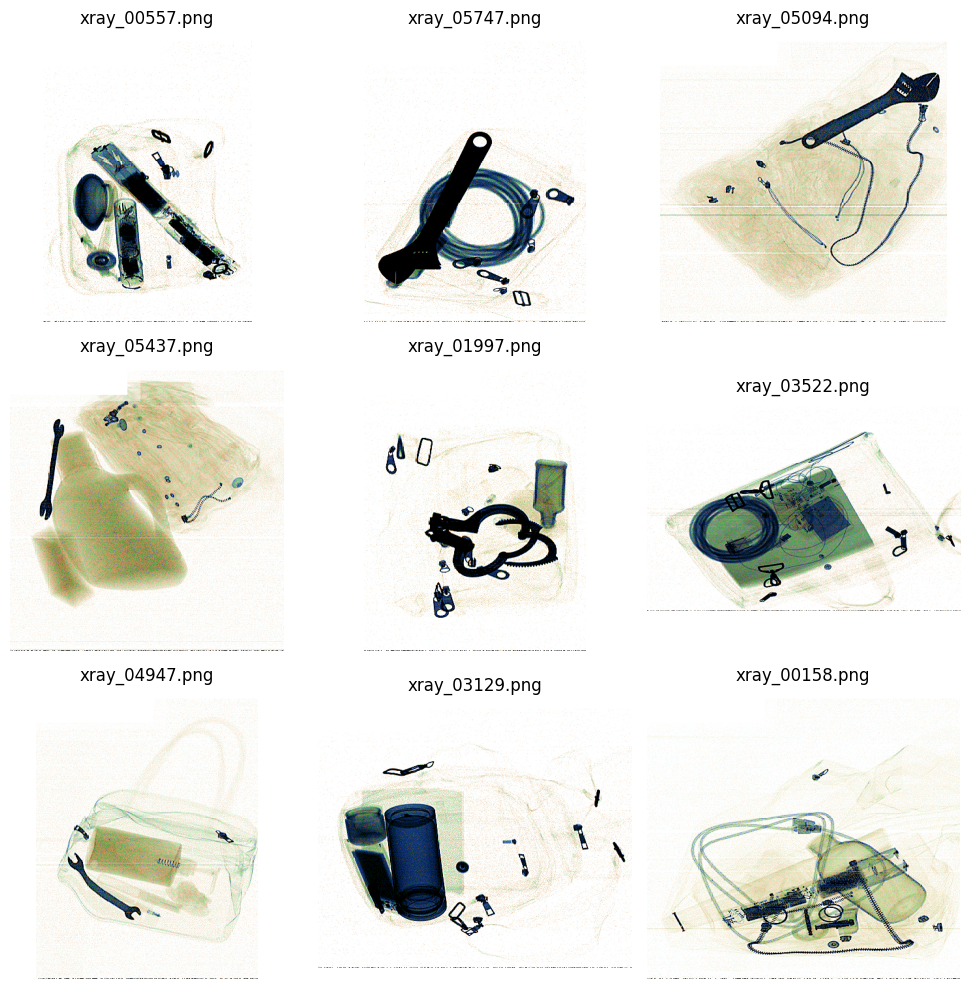

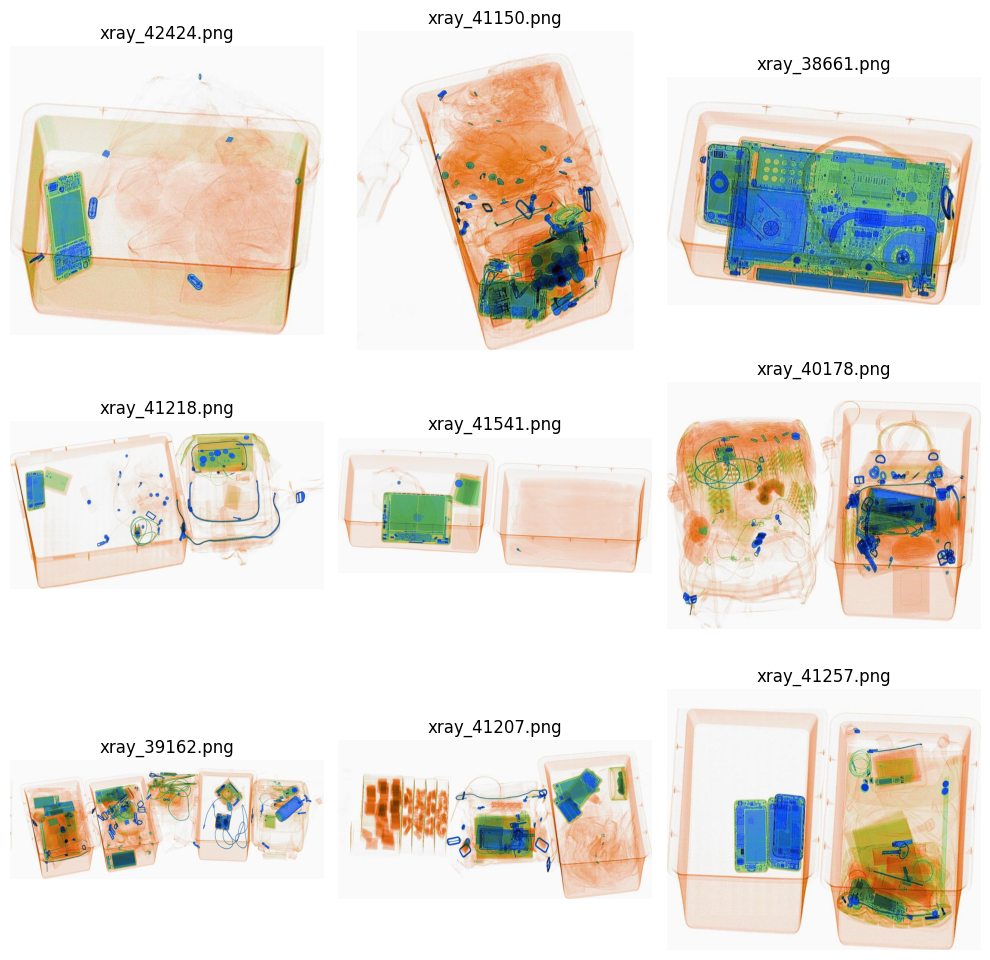

In [ ]:
import matplotlib.pyplot as plt
import random

def show_random_images(path, n=9):
    files = os.listdir(path)
    sel = random.sample(files, n)

    plt.figure(figsize=(10,10))
    for i, f in enumerate(sel):
        img = Image.open(os.path.join(path, f))
        plt.subplot(3,3,i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_random_images(safe_dir, n=9)
show_random_images(prohib_dir, n=9)


_Controlliamo se ci sono immagini corrotte (nere, vuote o danneggiate)_

In [ ]:
import numpy as np
def is_black_image(img):
    arr = np.array(img)
    return np.mean(arr) < 5  # threshold

def count_black_images(path):
    count = 0
    for f in os.listdir(path):
        img = Image.open(os.path.join(path, f))
        if is_black_image(img):
            count += 1
    return count

print("SAFE img nere:", count_black_images(safe_dir))
print("PROHIB img nere:", count_black_images(prohib_dir))


SAFE img nere: 0
PROHIB img nere: 0


*Controlliamo la cartella* `annotation.tar.gz`

In [ ]:
!tar -tf $DATASET_DIR/annotation.tar.gz | head -n 20


annotations/
annotations/test_easy.json
annotations/test_hidden.json
annotations/test.json
annotations/test_hard.json
annotations/train.json


Tutti file json, apriamone uno per esplorarne il contenuto

In [ ]:
import tarfile
import json
import os

# estrai UN solo file json
with tarfile.open(f"{DATASET_DIR}/annotation.tar.gz", 'r:gz') as tar:
    # prendi il primo file .json che trovi
    json_member = [m for m in tar.getmembers() if m.name.endswith(".json")][0]
    # Modifica il nome del membro per estrarlo direttamente nella cartella specificata
    json_member.name = os.path.basename(json_member.name)
    tar.extract(json_member, path="/content/annotation")

json_path = "/content/annotation/" + os.path.basename(json_member.name)

# leggiamo il json
with open(json_path, 'r') as f:
    js = json.load(f)

print(js)

/tmp/ipython-input-4000991584.py:11: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extract(json_member, path="/content/annotation")


{'info': 'spytensor created', 'license': ['license'], 'annotations': [{'id': 0, 'image_id': 0, 'category_id': 1, 'segmentation': [[310.28767123287673, 118.17808219178083, 207.54794520547944, 255.84931506849318, 193.84931506849318, 262.6986301369863, 156.86301369863014, 302.4246575342466, 187.0, 329.13698630136986, 234.26027397260276, 286.67123287671234, 237.0, 274.3424657534247, 343.8493150684932, 135.986301369863]], 'bbox': [156.86301369863014, 118.17808219178083, 186.98630136986304, 210.958904109589], 'iscrowd': 0, 'area': 9287.0}, {'id': 1, 'image_id': 1, 'category_id': 1, 'segmentation': [[254.53424657534248, 124.34246575342466, 243.5753424657534, 199.68493150684932, 240.83561643835617, 203.1095890410959, 237.41095890410958, 232.56164383561645, 239.46575342465752, 242.83561643835617, 231.9315068493151, 294.2054794520548, 223.02739726027397, 297.63013698630135, 215.4931506849315, 346.94520547945206, 223.02739726027397, 355.16438356164383, 251.79452054794524, 353.79452054794524, 262.

*Controlliamo velocemente i duplicati*

In [ ]:
len(set(os.listdir(safe_dir))), len(os.listdir(safe_dir))
# se coincidino -> non ci saranno duplicati

(6000, 6000)

In [ ]:
len(set(os.listdir(prohib_dir))), len(os.listdir(prohib_dir))
# se coincidino -> non ci saranno duplicati


(4000, 4000)

*Valutiamo la distribuzione dei colori (se sono grayscale o RGB)*

In [ ]:
import collections

def color_modes(path):
    modes = []
    for f in os.listdir(path):
        try:
            img = Image.open(os.path.join(path, f))
            modes.append(img.mode)
        except:
            continue
    return collections.Counter(modes)

print("SAFE:", color_modes(safe_dir))
print("PROHIB:", color_modes(prohib_dir))


SAFE: Counter({'RGB': 6000})
PROHIB: Counter({'RGB': 4000})


Risultati ottenuti dalla data exploration:
* tutte le immagini sono in RGB
* l'uso di questi colori è coerente con il contesto di scanner x-ray ai controlli aeroportuali:
1. arancione/rosso per materiali organici
2. blu per materiali metallici
3. verde per materiali plastici o elettronici
* non sono presenti immagini corrotte
* le immagini presentano dimensioni differenti
* estensione delle immagini tipo `.png`
* i file contenuti nella cartella `annotation` sono di tipo json (più avanti ci serviranno in fase di test)

# **3. Final Dataset Creation with Split**

Verifying where are the images

In [17]:
# recall the folders which contain the images
import os
print("Safe:", len(os.listdir('/content/dataset_safe')))
print("Prohibited:", len(os.listdir('/content/dataset_prohibited')))

Safe: 6000
Prohibited: 4000


*Random seed per riproducibilità*

In [25]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    tf.random.set_seed(seed)
    print(f"Random seed impostato a {seed}")

set_seed(42)

Random seed impostato a 42


## 3.1 Preparation

Labeling

In [30]:
# definition of folder's path
safe_dir = '/content/dataset_safe'
prohibited_dir = '/content/dataset_prohibited'

# list to collect data
data = []

# safe images -> label 0
if os.path.exists(safe_dir):
    for img_name in os.listdir(safe_dir):
      if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        data.append({
            'filepath': os.path.join(safe_dir, img_name),
            'label': 0
        })

# prohibited images -> label 1
if os.path.exists(prohibited_dir):
    for img_name in os.listdir(prohibited_dir):
      if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        data.append({
            'filepath': os.path.join(prohibited_dir, img_name),
            'label': 1
        })

# DataFrame creation using pandas
df = pd.DataFrame(data)
# shuffle the rows "per non averle ordinate per classe"
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

# verify
print(f"Totale immagini: {len(df)}")
print("\nDistribuzione classi:")
print(df['label'].value_counts())
# shows the first rows
df.head()

Totale immagini: 10000

Distribuzione classi:
label
0    6000
1    4000
Name: count, dtype: int64


,filepath,label
0,/content/dataset_prohibited/xray_41674.png,1
1,/content/dataset_safe/xray_03956.png,0
2,/content/dataset_safe/xray_03656.png,0
3,/content/dataset_safe/xray_01208.png,0
4,/content/dataset_safe/xray_02065.png,0


## 3.2 Split dati in train e validation

Vogliamo effettuare uno split 80 - 20

Train:
- class 0 - 80%
- class 1 - 80%

Validation:
- class 0 - 20%
- class 1 - 20%

In [31]:
from sklearn.model_selection import train_test_split

# Dividiamo: 80% Train, 20% Validation
train_df, val_df = train_test_split(
    df,               # Il dataframe completo
    test_size=0.2,    # 20% per la validazione
    stratify=df['label'], # Mantiene le proporzioni delle classi
    random_state=42   # Riproducibilità
)

# Resettiamo gli indici per pulizia
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

# Verifica dei risultati
print(f"Training Set: {len(train_df)} immagini")
print(f"Validation Set: {len(val_df)} immagini")

print("\nProporzioni classi nel Train:")
print(train_df['label'].value_counts(normalize=True))

print("\nProporzioni classi nel Val:")
print(val_df['label'].value_counts(normalize=True))

Training Set: 8000 immagini
Validation Set: 2000 immagini

Proporzioni classi nel Train:
label
0    0.6
1    0.4
Name: proportion, dtype: float64

Proporzioni classi nel Val:
label
0    0.6
1    0.4
Name: proportion, dtype: float64


## 3.3 Data Loading & Preprocessing

Define the transformation

In [33]:
import torch
from torchvision import transforms

IMG_SIZE = 224

# Definizione trasformazioni Training
train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ToTensor(),
])

# Definizione trasformazioni Validation
val_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

DataLoader creation

In [34]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image

# 1. Definiamo la classe Dataset personalizzata
class PIDrayDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        # Recupera il percorso e la label dalla riga idx
        img_path = self.dataframe.iloc[idx]['filepath']
        label = self.dataframe.iloc[idx]['label']

        # Apre l'immagine e converte in RGB (per evitare errori con immagini in bianco e nero o con trasparenza)
        image = Image.open(img_path).convert('RGB')

        # Applica le trasformazioni (Resize, Augmentation, ecc.)
        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.long)

# 2. Creiamo le istanze del Dataset
train_dataset = PIDrayDataset(train_df, transform=train_transforms)
val_dataset = PIDrayDataset(val_df, transform=val_transforms)

# 3. Creiamo i DataLoader (i "camerieri" che servono i batch)
BATCH_SIZE = 32

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# 4. Verifica finale: prendiamo un batch di prova
images, labels = next(iter(train_loader))
print(f"Batch shape immagini: {images.shape}") # Dovrebbe essere [32, 3, 224, 224]
print(f"Batch shape labels: {labels.shape}")   # Dovrebbe essere [32]

Batch shape immagini: torch.Size([32, 3, 224, 224])
Batch shape labels: torch.Size([32])
